In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_masks.npy')

In [3]:
X_test = images[1700:2141]
y_test = masks[1700:2141]

In [4]:
images = images[0:1700]
masks = masks[0:1700]

In [5]:
barebone_model = '/tmp/tmp7h8stef3kuc_unet2d/kuc_unet2d_0kuc_unet2d_model'

In [6]:
images.shape

(1700, 512, 512, 1)

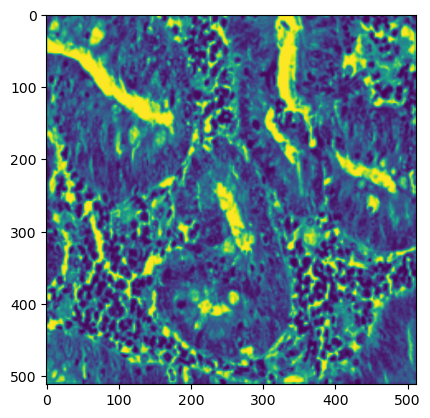

In [7]:
imshow(images[100])

In [8]:
masks.shape

(1700, 512, 512, 1)

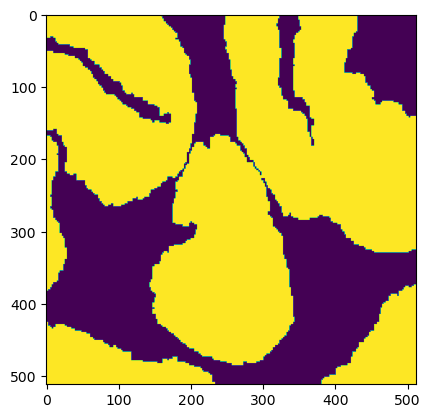

In [9]:
imshow(masks[100])

In [10]:
import sys
sys.path.append('../')
import gp2

In [11]:
from keras import losses

In [12]:
loss_fx = losses.BCE

In [13]:
C = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpihooypqwkuc_unet2d


In [14]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmpihooypqwkuc_unet2d
Verbose mode active!


In [15]:
R.classifier = C ### use custom classifier

In [16]:
R.run(images, masks, runs=5, batch_size=16, shuffle=True, results_file='/raid/mpsych/OMAMA/GP2/results/kuc_unet2d_0kuc_unet2d_model_3_5_EBHI_filtered.pkl')

Shuffling data...
Weights OK!
******
Loop 1
Epoch 1/100
6/6 [==============================] - 21s 2s/step - loss: 0.3173 - dice_coeff: 0.8590 - val_loss: 0.2979 - val_dice_coeff: 0.8750
Epoch 2/100
6/6 [==============================] - 3s 477ms/step - loss: 0.2869 - dice_coeff: 0.8580 - val_loss: 0.3029 - val_dice_coeff: 0.8467
Epoch 3/100
6/6 [==============================] - 3s 474ms/step - loss: 0.2796 - dice_coeff: 0.8724 - val_loss: 0.2883 - val_dice_coeff: 0.8693
Epoch 4/100
6/6 [==============================] - 3s 471ms/step - loss: 0.2796 - dice_coeff: 0.8735 - val_loss: 0.2941 - val_dice_coeff: 0.8825
Epoch 5/100
6/6 [==============================] - 3s 476ms/step - loss: 0.2808 - dice_coeff: 0.8720 - val_loss: 0.2940 - val_dice_coeff: 0.8571
Model saved to: /tmp/tmpihooypqwkuc_unet2d/kuc_unet2d_0kuc_unet2d_model
History saved to: /tmp/tmpihooypqwkuc_unet2d/kuc_unet2d_history_0.pkl
Testing the classifier...
Model saved to /tmp/tmpihooypqwkuc_unet2d/cnnd_0.model
History sa

In [17]:
R.classifier_scores

[[0.3031875491142273, 0.8513901233673096],
 [0.28566035628318787, 0.8659766316413879],
 [0.29146432876586914, 0.8571143746376038],
 [0.283845454454422, 0.8687982559204102],
 [0.28950244188308716, 0.8756216764450073]]

In [18]:
R.discriminator_scores

[[0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0]]

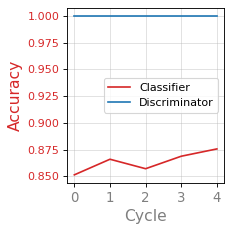

In [19]:
R.plot()

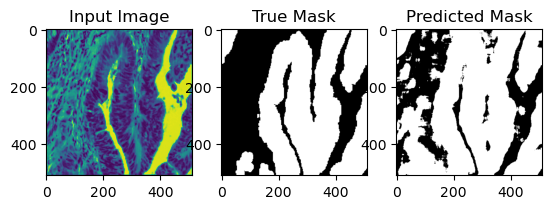

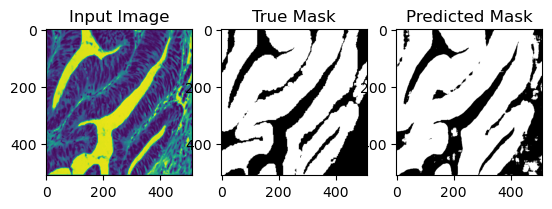

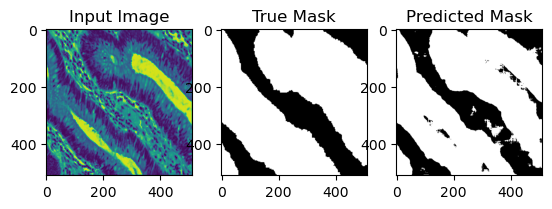

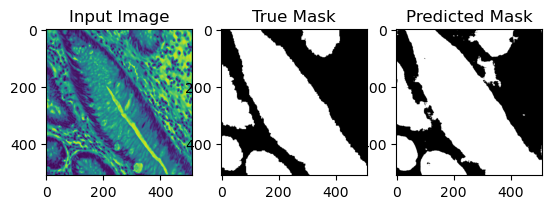

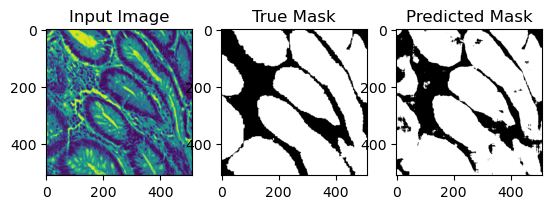

...

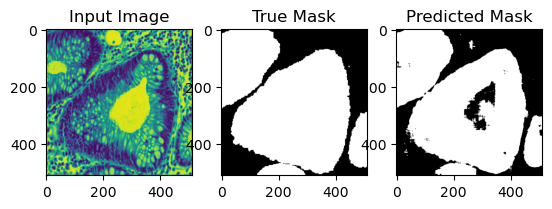

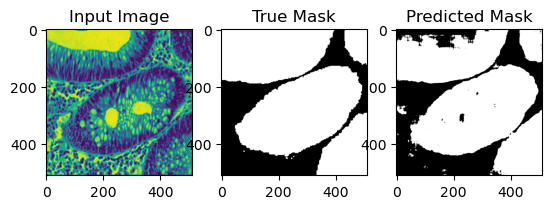

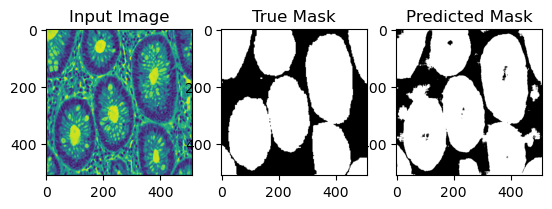

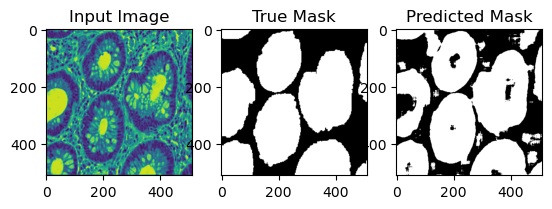

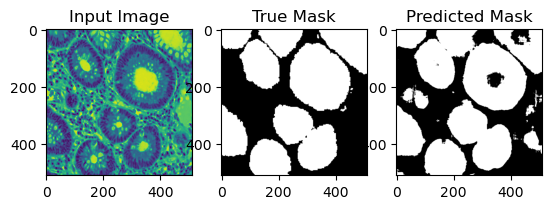

In [20]:
gp2.Util.visualize_predictions(C, X_test, y_test, num_samples=100)

In [21]:
y_pred = R.classifier.predict(X_test, y_test)

In [22]:
y_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [23]:
BareBone = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpihooypqwkuc_unet2d


In [24]:
barebone_pred = BareBone.predict(X_test, y_test)

In [25]:
barebone_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [26]:
BareBone.model.metrics_names

['loss', 'dice_coeff']